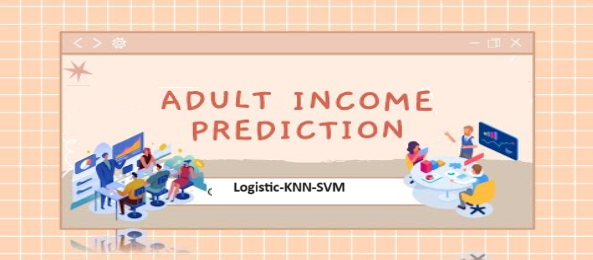

# About for Logistic, KNN and SVM Models
Here's the comparison of Logistic Regression, K-Nearest Neighbors (KNN), and Support Vector Machines (SVM) across various aspects:

1. **Model Differences:**
   - **Logistic Regression:** It's typically used for classification problems and is a linear model. It uses a probability-based approach.
   - **KNN:** It's a simple algorithm used for classification or regression problems. During classification, it looks at the majority of classes among its neighbors.
   - **SVM:** It's a model used for both classification and regression. It can be used with different kernels (e.g., linear, polynomial, RBF) and applied to nonlinear classification problems.

2. **Model Performance:**
   - Performance varies based on the dataset and the problem. In some cases, SVM might perform better in complex classification problems. However, in small datasets or linear problems, Logistic Regression or simple KNN can also be effective.

3. **Hyperparameters and Tunability:**
   - Logistic Regression typically has fewer hyperparameters and is easier to apply.
   - KNN's main hyperparameter is the "k" value (number of neighbors).
   - SVM has more hyperparameters (C, gamma, kernel type, etc.), and tuning these often requires more experience and computation.

4. **Data Size and Feature Count:**
   - Logistic Regression and KNN generally perform well on small datasets or with a low number of features.
   - SVM is effective, especially on datasets with a high number of features and not necessarily a large number of examples. It can handle nonlinear problems with the help of the kernel trick.

5. **Computation Time:**
   - Computation time depends on the dataset size and model complexity. Typically, KNN requires more computation during prediction since it needs to calculate neighbors each time for prediction. SVM might sometimes take longer during the training phase, especially with large datasets or complex kernel functions.

Determining the best model depends on the dataset, problem nature, and performance metrics. Usually, trying out different models and comparing their performances tends to yield the best result.

# Adult Income Prediction

**Data Set Information:**

This dataset was obtained from UCI Machine Learning Repository. The aim of this problem is to classify adults in two different groups based on their income where group 1 has an income less than USD 50k and group 2 has an income of more than or equal to USD 50k. The data available at hand comes from Census 1994.

**Attribute Information:**

**Age**: Describes the age of individuals. Continuous.

**Workclass**: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.

**fnlwgt**: Continuous value is a weighting factor generated by the U.S. Census Bureau, indicating the actual representation of each data entry within the population. However, it's typically not directly used in machine learning models or analyses.

Although these weighting factors aren't directly employed during model training or testing, they can be useful for conducting more in-depth demographic analysis of the dataset. Specifically, they might be employed for identifying demographic characteristics or gaining a deeper insight into the societal or demographic features of the dataset. 

**education**: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.

**education-num**: Number of years spent in education. Continuous.

**marital-status**: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.

**occupation**: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.

**relationship**: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.

**race**: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.

**sex**: Female, Male.

**capital-gain**: Bir bireyin varlık satışlarından (örneğin, hisse senedi veya gayrimenkul satışı) elde ettiği kazancı temsil eder. Continuous.

**capital-loss**: Bir bireyin varlık satışlarından (örneğin, hisse senedi veya gayrimenkul satışı) uğradığı zararı temsil eder. Continuous.

**hours-per-week**: Continuous.

**native-country**: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.

**salary**: >50K,<=50K.


# Import libraries

In [1]:
# Libraries for EDA
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import cufflinks as cf

from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()

# To show graphics
%matplotlib inline
plt.rcParams['figure.figsize'] = 10, 6

# Sklearn library for machine learning algorithms, data preprocessing and evaluation
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import log_loss, recall_score, accuracy_score, precision_score, f1_score
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, auc

# To get rid of warnings
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

# Exploratory Data Analysis and Visualization

In [2]:
df = pd.read_csv("adult.csv") 

In [3]:
df.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


In [4]:
def summary(df, pred=None):
    obs = df.shape[0]
    Types = df.dtypes
    Counts = df.apply(lambda x: x.count())
    Min = df.min()
    Max = df.max()
    Uniques = df.apply(lambda x: x.unique().shape[0])
    Nulls = df.apply(lambda x: x.isnull().sum())
    print('Data shape:', df.shape)

    if pred is None:
        cols = ['Types', 'Counts', 'Uniques', 'Nulls', 'Min', 'Max']
        str = pd.concat([Types, Counts, Uniques, Nulls, Min, Max], axis = 1, sort=True)

    str.columns = cols
    print('___________________________\nData Types:')
    print(str.Types.value_counts())
    print('___________________________')
    return str

summary(df)

Data shape: (32561, 15)
___________________________
Data Types:
object    9
int64     6
Name: Types, dtype: int64
___________________________


,Types,Counts,Uniques,Nulls,Min,Max
age,int64,32561,73,0,17,90
capital.gain,int64,32561,119,0,0,99999
capital.loss,int64,32561,92,0,0,4356
education,object,32561,16,0,10th,Some-college
education.num,int64,32561,16,0,1,16
fnlwgt,int64,32561,21648,0,12285,1484705
hours.per.week,int64,32561,94,0,1,99
income,object,32561,2,0,<=50K,>50K
marital.status,object,32561,7,0,Divorced,Widowed
native.country,object,32561,42,0,?,Yugoslavia


In [5]:
# Checks for duplicate observations in the dataset and removes them

def duplicate_values(df):
    print("Duplicate check...")
    num_duplicates = df.duplicated(subset=None, keep='first').sum()
    if num_duplicates > 0:
        print("There are", num_duplicates, "duplicated observations in the dataset.")
        df.drop_duplicates(keep='first', inplace=True)
        print(num_duplicates, "duplicates were dropped!")
        print("No more duplicate rows!")
    else:
        print("There are no duplicated observations in the dataset.")

In [6]:
duplicate_values(df)

Duplicate check...
There are 24 duplicated observations in the dataset.
24 duplicates were dropped!
No more duplicate rows!


In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,32537.0,38.585549,13.637984,17.0,28.0,37.0,48.0,90.0
fnlwgt,32537.0,189780.848511,105556.471009,12285.0,117827.0,178356.0,236993.0,1484705.0
education.num,32537.0,10.081815,2.571633,1.0,9.0,10.0,12.0,16.0
capital.gain,32537.0,1078.443741,7387.957424,0.0,0.0,0.0,0.0,99999.0
capital.loss,32537.0,87.368227,403.101833,0.0,0.0,0.0,0.0,4356.0
hours.per.week,32537.0,40.440329,12.346889,1.0,40.0,40.0,45.0,99.0


In [8]:
df.describe(include="object").T

,count,unique,top,freq
workclass,32537,9,Private,22673
education,32537,16,HS-grad,10494
marital.status,32537,7,Married-civ-spouse,14970
occupation,32537,15,Prof-specialty,4136
relationship,32537,6,Husband,13187
race,32537,5,White,27795
sex,32537,2,Male,21775
native.country,32537,42,United-States,29153
income,32537,2,<=50K,24698


## Missing Value Control 

In [9]:
# Detects null values in the data set and sorts them as numbers and percentages

def missing_values(df):
    missing_number = df.isnull().sum().sort_values(ascending = False)
    missing_percent = (df.isnull().sum() / df.isnull().count()).sort_values(ascending = False)
    missing_values = pd.concat([missing_number, missing_percent], axis = 1, keys = ['Missing_Number', 'Missing_Percent'])
    return missing_values[missing_values['Missing_Number'] > 0]

In [10]:
missing_values(df)

,Missing_Number,Missing_Percent


In [11]:
# Shows unique values in each column
for column in df.columns:
    unique_values = df[column].unique()
    print(f"--- {column} Column' s Unique Values ---")
    print(unique_values)
    print("\n")

--- age Column' s Unique Values ---
[90 82 66 54 41 34 38 74 68 45 52 32 51 46 57 22 37 29 61 21 33 49 23 59
 60 63 53 44 43 71 48 73 67 40 50 42 39 55 47 31 58 62 36 72 78 83 26 70
 27 35 81 65 25 28 56 69 20 30 24 64 75 19 77 80 18 17 76 79 88 84 85 86
 87]


--- workclass Column' s Unique Values ---
['?' 'Private' 'State-gov' 'Federal-gov' 'Self-emp-not-inc' 'Self-emp-inc'
 'Local-gov' 'Without-pay' 'Never-worked']


--- fnlwgt Column' s Unique Values ---
[ 77053 132870 186061 ...  34066  84661 257302]


--- education Column' s Unique Values ---
['HS-grad' 'Some-college' '7th-8th' '10th' 'Doctorate' 'Prof-school'
 'Bachelors' 'Masters' '11th' 'Assoc-acdm' 'Assoc-voc' '1st-4th' '5th-6th'
 '12th' '9th' 'Preschool']


--- education.num Column' s Unique Values ---
[ 9 10  4  6 16 15 13 14  7 12 11  2  3  8  5  1]


--- marital.status Column' s Unique Values ---
['Widowed' 'Divorced' 'Separated' 'Never-married' 'Married-civ-spouse'
 'Married-spouse-absent' 'Married-AF-spouse']


--- occu

In [12]:
# All '?' in the data set replaces values with NaN

df.replace(to_replace='?',value=np.nan,inplace=True)

In [13]:
missing_values(df)

,Missing_Number,Missing_Percent
occupation,1843,0.056643
workclass,1836,0.056428
native.country,582,0.017887


### workclass 

In [14]:
df['workclass'].value_counts(normalize=True)

Private             0.738510
Self-emp-not-inc    0.082733
Local-gov           0.068174
State-gov           0.042279
Self-emp-inc        0.036351
Federal-gov         0.031269
Without-pay         0.000456
Never-worked        0.000228
Name: workclass, dtype: float64

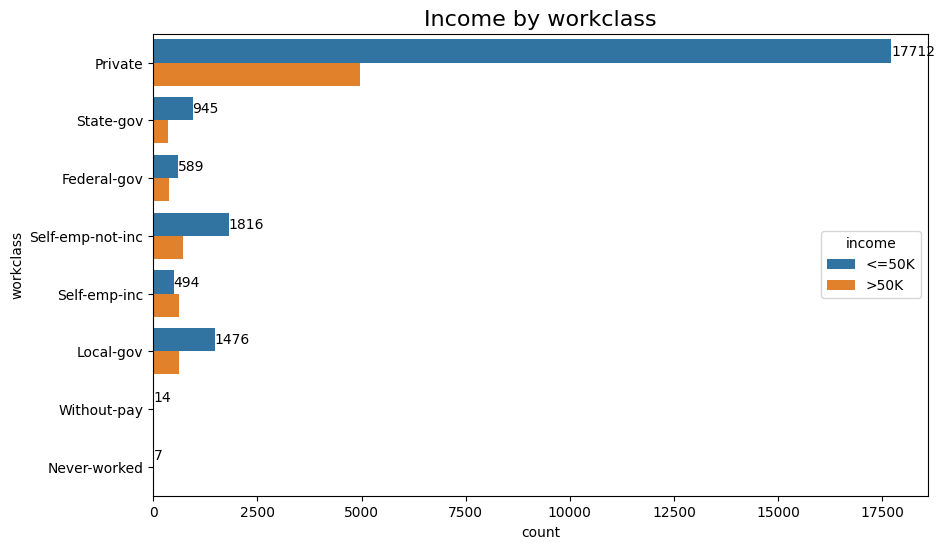

In [15]:
plt.figure(figsize = (10,6))
ax = sns.countplot(y = df['workclass'], hue = df['income'])
plt.title("Income by workclass", fontsize = 16)
ax.bar_label(ax.containers[0]);

In [16]:
# Replaces "Nan" values in workclass column with "Private"
df['workclass'] = df['workclass'].fillna('Private')

In [17]:
missing_values(df)

,Missing_Number,Missing_Percent
occupation,1843,0.056643
native.country,582,0.017887


### occupation

In [18]:
df['occupation'].value_counts(normalize=True)

Prof-specialty       0.134749
Craft-repair         0.133381
Exec-managerial      0.132436
Adm-clerical         0.122760
Sales                0.118916
Other-service        0.107220
Machine-op-inspct    0.065159
Transport-moving     0.052030
Handlers-cleaners    0.044602
Farming-fishing      0.032319
Tech-support         0.030201
Protective-serv      0.021144
Priv-house-serv      0.004789
Armed-Forces         0.000293
Name: occupation, dtype: float64

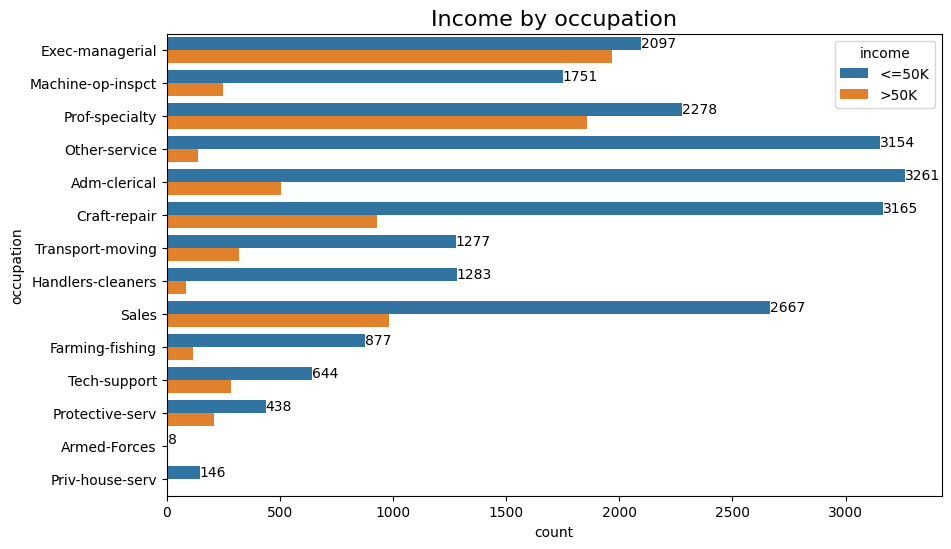

In [19]:
plt.figure(figsize = (10,6))
ax = sns.countplot(y = df['occupation'], hue = df['income'])
plt.title("Income by occupation", fontsize = 16)
ax.bar_label(ax.containers[0]);

In [20]:
# bfill (backward fill) fills missing values with the next available value.

df['occupation'] = df['occupation'].fillna(method='bfill')


In [21]:
missing_values(df)

,Missing_Number,Missing_Percent
native.country,582,0.017887


### native country 

In [22]:
df['native.country'].value_counts(normalize=True)

United-States                 0.912314
Mexico                        0.019997
Philippines                   0.006196
Germany                       0.004287
Canada                        0.003787
Puerto-Rico                   0.003568
El-Salvador                   0.003317
India                         0.003129
Cuba                          0.002973
England                       0.002816
Jamaica                       0.002535
South                         0.002504
China                         0.002347
Italy                         0.002284
Dominican-Republic            0.002191
Vietnam                       0.002097
Guatemala                     0.001940
Japan                         0.001940
Poland                        0.001878
Columbia                      0.001846
Taiwan                        0.001596
Haiti                         0.001377
Iran                          0.001346
Portugal                      0.001158
Nicaragua                     0.001064
Peru                     

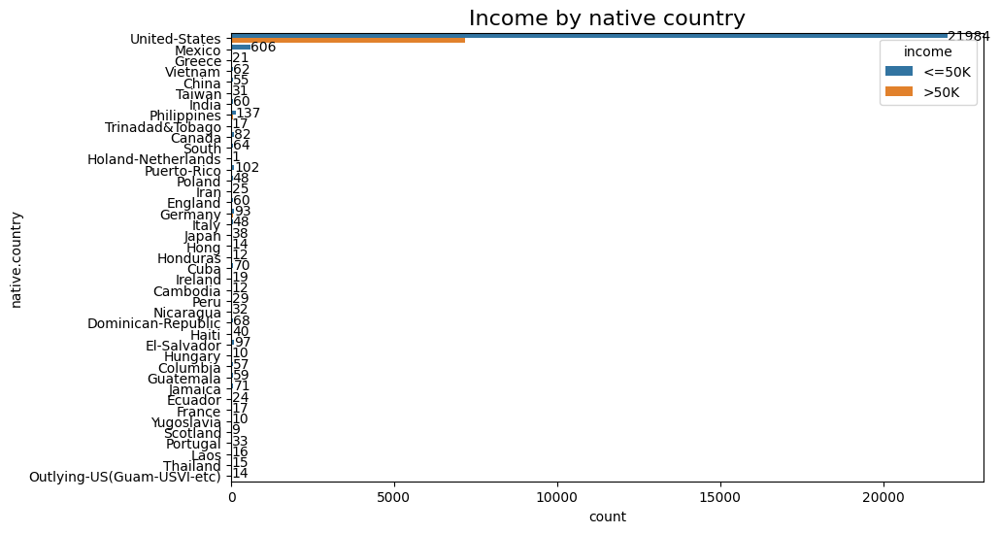

In [23]:
plt.figure(figsize = (10,6))
ax = sns.countplot(y = df['native.country'], hue = df['income'])
plt.title("Income by native country", fontsize = 16)
ax.bar_label(ax.containers[0]);

In [24]:
# Replaces "Nan" values in native.country column with "United-States"

df['native.country'] = df['native.country'].fillna('United-States')

In [25]:
missing_values(df)

,Missing_Number,Missing_Percent


## Target Variable

In [26]:
# To quickly examine the distribution of values in a particular column in a data set 

def value_cnt(df, column_name):
    vc = df[column_name].value_counts()
    vc_norm = df[column_name].value_counts(normalize=True)

    vc = vc.rename_axis(column_name).reset_index(name='counts')
    vc_norm = vc_norm.rename_axis(column_name).reset_index(name='norm_counts')

    df_result = pd.concat([vc[column_name], vc['counts'], vc_norm['norm_counts']], axis=1)
    
    return df_result

In [27]:
print(df.income.value_counts())
print("---------------------")
print(df.income.value_counts(normalize=True))

<=50K    24698
>50K      7839
Name: income, dtype: int64
---------------------
<=50K    0.759074
>50K     0.240926
Name: income, dtype: float64


In [28]:
income_distr = df['income'].value_counts().reset_index()
income_distr.columns = ['index', 'income']  # Sütun isimlerini değiştirin
fig = px.pie(income_distr, values='income', names='index')
fig.update_layout(title="Income Distribution")
fig.show()

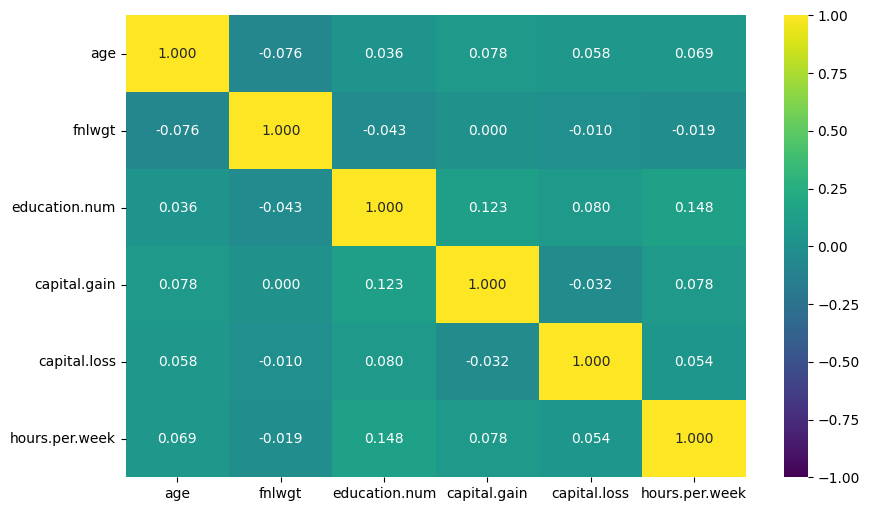

In [29]:
numeric_df = df.select_dtypes(include=[np.number])
sns.heatmap(numeric_df.corr(),vmin=-1,vmax=1, annot=True, fmt='.3f', cmap='viridis');

In [30]:
# Changes the values in the income column to '<=50K': 0, '>50K': 1
df['income']=df['income'].map({'<=50K': 0, '>50K': 1})

In [31]:
df.sample(5)

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
18592,22,Private,401451,Some-college,10,Married-civ-spouse,Transport-moving,Husband,White,Male,0,0,48,United-States,1
23640,35,Self-emp-not-inc,32528,HS-grad,9,Married-civ-spouse,Transport-moving,Husband,White,Male,0,0,50,United-States,0
12740,30,Private,54608,Bachelors,13,Married-civ-spouse,Adm-clerical,Husband,White,Male,0,0,40,United-States,0
9037,35,Self-emp-not-inc,269300,Bachelors,13,Never-married,Other-service,Not-in-family,Black,Female,0,0,60,United-States,0
19725,26,Private,106406,Some-college,10,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,40,United-States,0


<AxesSubplot:>

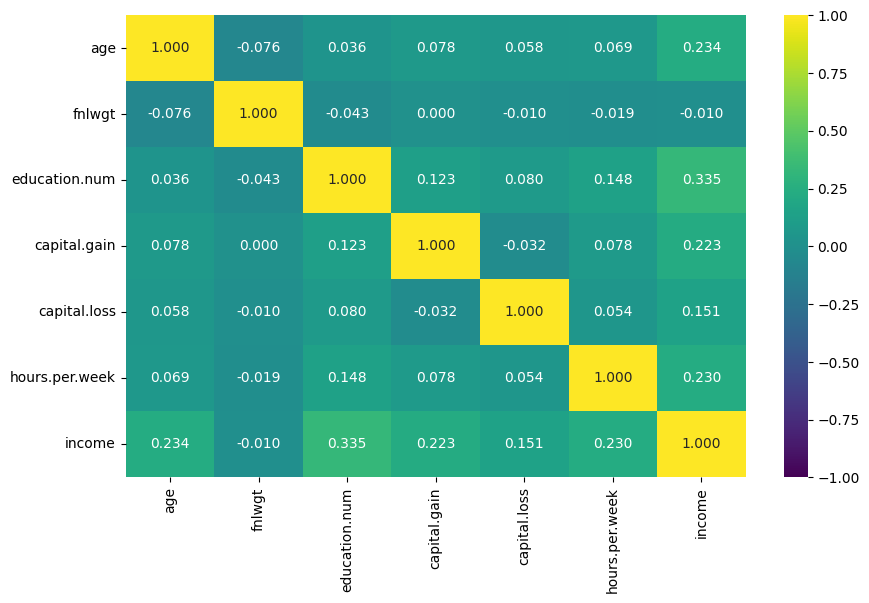

In [32]:
numeric_cols = df.select_dtypes(include=[np.number])  
sns.heatmap(numeric_cols.corr(), vmin=-1, vmax=1, annot=True, fmt='.3f', cmap='viridis')

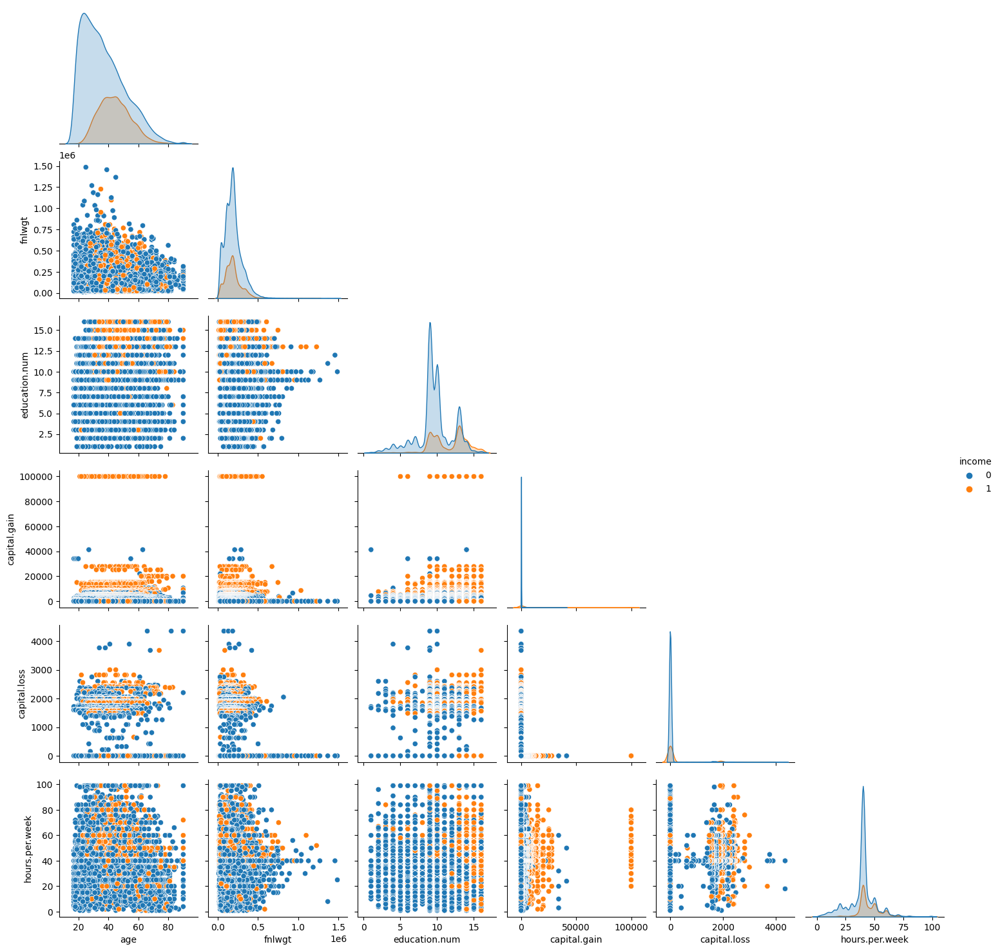

In [32]:
sns.pairplot(df, hue = "income", corner=True);

## Age

In [33]:
px.histogram(df, x='age', color="income", barmode='group', title='Income Distribution by Age')

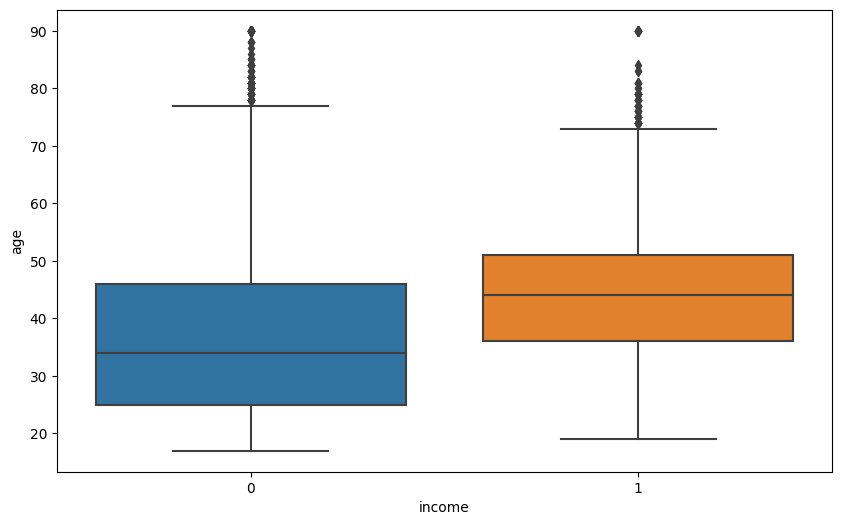

In [36]:
 sns.boxplot(data=df,y="age",x='income');

## Work Class 

In [37]:
value_cnt(df, 'workclass')

,workclass,counts,norm_counts
0,Private,24509,0.753266
1,Self-emp-not-inc,2540,0.078065
2,Local-gov,2093,0.064327
3,State-gov,1298,0.039893
4,Self-emp-inc,1116,0.034299
5,Federal-gov,960,0.029505
6,Without-pay,14,0.000430
7,Never-worked,7,0.000215


In [38]:
px.histogram(df, x='workclass', color="income", barmode='group', title='Income Distribution by Work Class')

## fnlwgt 

In [39]:
px.histogram(df, x='fnlwgt', color="income", barmode='group', title='Income Distribution by fnlwgt')

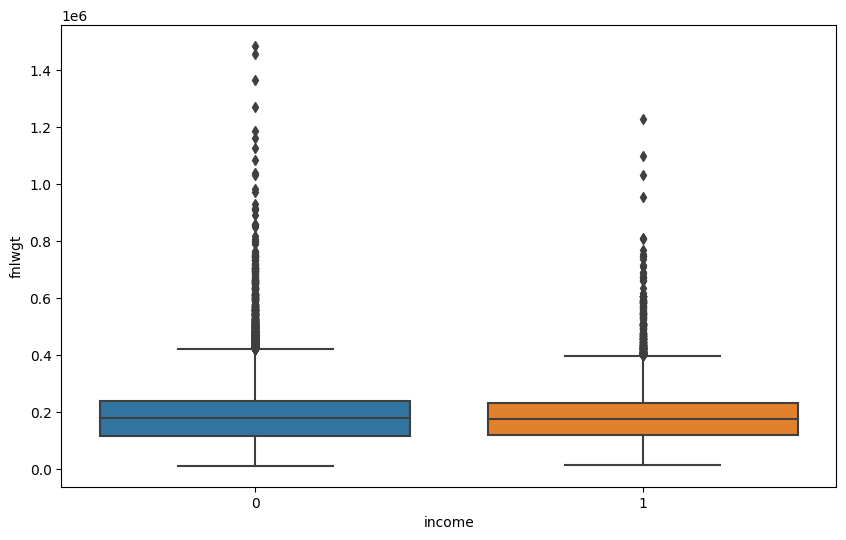

In [40]:
sns.boxplot(data=df,y="fnlwgt",x='income');

In [41]:
df.drop(['fnlwgt'], axis = 1, inplace = True)

## Education and Education Num

In [42]:
value_cnt(df, 'education')

,education,counts,norm_counts
0,HS-grad,10494,0.322525
1,Some-college,7282,0.223807
2,Bachelors,5353,0.164520
3,Masters,1722,0.052924
4,Assoc-voc,1382,0.042475
5,11th,1175,0.036113
6,Assoc-acdm,1067,0.032793
7,10th,933,0.028675
8,7th-8th,645,0.019824
9,Prof-school,576,0.017703


In [43]:
df['education'].replace(['11th', '9th', '7th-8th', '5th-6th', '10th', '1st-4th', '12th'], 'School', inplace = True)

In [44]:
px.histogram(df, x='education', color=df.income, barmode='group', title='Income Distribution by Education Level')

In [45]:
px.histogram(df, x='education.num', color="income", barmode='group', title='Income Distribution by Education Num')

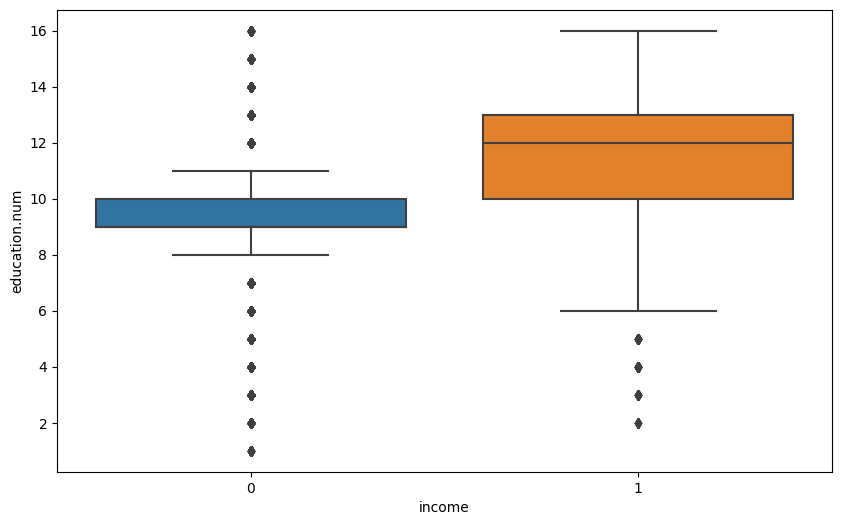

In [47]:
sns.boxplot(data=df,y="education.num",x='income');

## Marital Status

In [48]:
value_cnt(df, 'marital.status')

,marital.status,counts,norm_counts
0,Married-civ-spouse,14970,0.460092
1,Never-married,10667,0.327842
2,Divorced,4441,0.136491
3,Separated,1025,0.031503
4,Widowed,993,0.030519
5,Married-spouse-absent,418,0.012847
6,Married-AF-spouse,23,0.000707


In [49]:
px.histogram(df, x='marital.status', color="income", barmode='group', title='Income Distribution by Marital Status')

## Occupation

In [50]:
value_cnt(df, 'occupation')

,occupation,counts,norm_counts
0,Prof-specialty,4394,0.135046
1,Craft-repair,4326,0.132956
2,Exec-managerial,4274,0.131358
3,Adm-clerical,3989,0.122599
4,Sales,3860,0.118634
5,Other-service,3516,0.108062
6,Machine-op-inspct,2126,0.065341
7,Transport-moving,1685,0.051787
8,Handlers-cleaners,1464,0.044995
9,Farming-fishing,1069,0.032855


In [51]:
px.histogram(df, x='occupation', color="income", barmode='group', title='Income Distribution by Occupation')

## Relationship

In [52]:
value_cnt(df, 'relationship')

,relationship,counts,norm_counts
0,Husband,13187,0.405292
1,Not-in-family,8292,0.254848
2,Own-child,5064,0.155638
3,Unmarried,3445,0.105879
4,Wife,1568,0.048191
5,Other-relative,981,0.030150


In [53]:
px.histogram(df, x='relationship', color="income", barmode='group', title='Income Distribution by Relationship')

## Race

In [54]:
value_cnt(df, 'race')

,race,counts,norm_counts
0,White,27795,0.854258
1,Black,3122,0.095952
2,Asian-Pac-Islander,1038,0.031902
3,Amer-Indian-Eskimo,311,0.009558
4,Other,271,0.008329


In [55]:
df['race'].replace(['Asian-Pac-Islander', 'Amer-Indian-Eskimo', 'Other'],' Others', inplace = True)

In [56]:
px.histogram(df, x='race', color="income", barmode='group', title='Income Distribution by Race')

## Sex

In [56]:
value_cnt(df, 'sex')

,sex,counts,norm_counts
0,Male,21775,0.669238
1,Female,10762,0.330762


In [58]:
px.histogram(df, x='sex', color="income", barmode='group', title='Income Distribution by Sex')

## Capital Gain and Loss

In [57]:
px.histogram(df, x='capital.gain', color="income", barmode='group', title='Income Distribution by Capital Gain')

In [58]:
px.histogram(df, x='capital.loss', color="income", barmode='group', title='Income Distribution by Capital Loss')

In [59]:
df['capital_diff'] = df['capital.gain'] - df['capital.loss']
df['capital_diff'] = pd.cut(df['capital_diff'], bins = [-5000, 5000, 100000], labels = ['Low', 'High'])
df['capital_diff'] = df['capital_diff'].astype('object')
df.drop(['capital.gain'], axis = 1, inplace = True)
df.drop(['capital.loss'], axis = 1, inplace = True)

Divides the 'Capital Diff' column into two categories ('Low' and 'High').

The values in the 'Capital Diff' column are divided into categories by cutting them between the specified limits.

These limits are specified by the bins parameter.

Values between -5000 and 5000 are assigned to the 'Minor' category, while values between 5000 and 100000 are assigned to the 'Major' category.

**Aim:**

The aim is to simplify the data frame by combining the information of capital.gain and capital.loss columns into a single categorical column and categorize whether the total gain/loss from these two columns is low or high.

In [60]:
value_cnt(df, 'capital_diff')

,capital_diff,counts,norm_counts
0,Low,30889,0.94935
1,High,1648,0.05065


In [61]:
px.histogram(df, x='capital_diff', color="income", barmode='group', title='Income Distribution by Capital Diff')

## Hours per Week

In [62]:
px.histogram(df, x='hours.per.week', color="income", barmode='group', title='Income Distribution by Hours per Week')

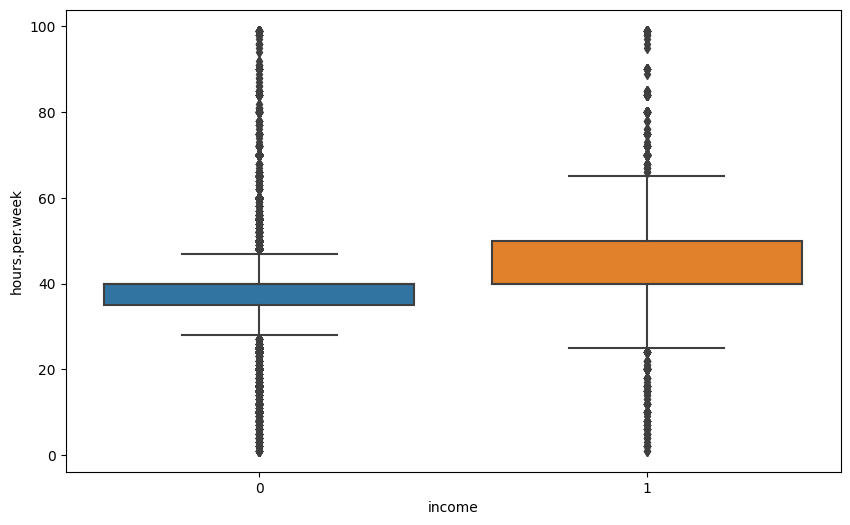

In [64]:
sns.boxplot(data=df,y="hours.per.week",x='income');

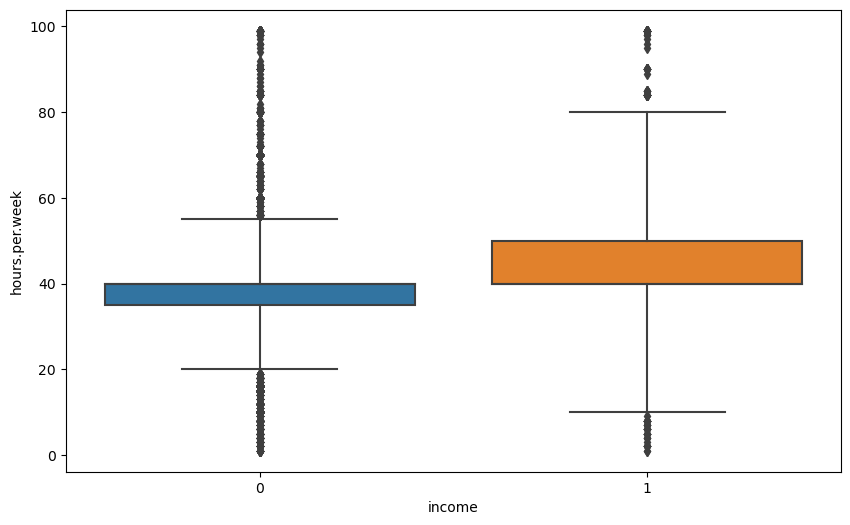

In [66]:
sns.boxplot(data=df,y="hours.per.week",x='income', whis=3);

In [65]:
# Total number of individuals with more than 72 working hours per week

len(df[df["hours.per.week"]>72])  

427

In [66]:
#Total number of individuals with less than 20 working hours per week

len(df[df["hours.per.week"]<20])  

1700

In [67]:
# Total number of individuals with more than 72 or fewer than 20 weekly working hours

len(df[(df["hours.per.week"] > 72) | (df["hours.per.week"] < 20)])

2127

In [68]:
df = df[~((df["hours.per.week"] > 72) | (df["hours.per.week"] < 20))]

In [69]:
df.shape

(30410, 13)

## Native Country

In [70]:
value_cnt(df, 'native.country')

,native.country,counts,norm_counts
0,United-States,27762,0.912923
1,Mexico,613,0.020158
2,Philippines,186,0.006116
3,Germany,127,0.004176
4,Canada,113,0.003716
5,Puerto-Rico,109,0.003584
6,El-Salvador,100,0.003288
7,India,95,0.003124
8,Cuba,90,0.002960
9,England,84,0.002762


In [71]:
px.histogram(df, x='native.country', color="income", barmode='group', title='Income Distribution by Native Country')

In [72]:
df['native.country'].loc[df['native.country'] != 'United-States'] = 'Others'

In [73]:
value_cnt(df, 'native.country')

,native.country,counts,norm_counts
0,United-States,27762,0.912923
1,Others,2648,0.087077


In [74]:
px.histogram(df, x='native.country', color="income", barmode='group', title='Income Distribution by Native Country')

In [75]:
df1 = df.copy()

In [78]:
df.to_excel('end.xlsx', index=False)

In [79]:
df = pd.read_excel('end.xlsx')

# Data Pre-Processing

## Train | Test Split

In [80]:
X= df.drop(columns="income")
y= df.income

In [81]:
# Since my data set is unbalanced, let's use stratify=y

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=101)

Preschool : Okul öncesi
School: İlköğretim veya ortaöğretim
HS-grad: Lise mezuniyeti
Some-college: Üniversiteye bir süre devam etmiş ama tamamlamamış
Assoc-voc: Mesleki eğitim diploması
Assoc-acdm: Akademik eğitim diploması
Bachelors: Lisans
Masters: Yüksek Lisans
Prof-school: Profesyonel okul (örn. Hukuk veya Tıp okulu gibi)
Doctorate: Doktora

In [82]:
cat_onehot = ['workclass', 'occupation', 'relationship', 'race', 'sex', 'native.country', 'marital.status']
cat_ordinal = ['education', 'capital_diff']
    
cat_for_edu = ['Preschool', 'School', 'HS-grad','Some-college', 'Assoc-voc', 'Assoc-acdm','Bachelors', 'Masters', 'Prof-school', 'Doctorate']
cat_for_capdiff = ['Low', 'High']

In [83]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder

column_trans = make_column_transformer((OneHotEncoder(handle_unknown="ignore", sparse=False), cat_onehot), 
                                       (OrdinalEncoder(categories= [cat_for_edu, cat_for_capdiff]), cat_ordinal),
                                       remainder='passthrough') # MinMaxScaler()


In [84]:
X_train.head()

,age,workclass,education,education.num,marital.status,occupation,relationship,race,sex,hours.per.week,native.country,capital_diff
6967,61,Private,School,6,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,40,United-States,Low
1836,40,Self-emp-inc,Assoc-acdm,12,Married-civ-spouse,Sales,Husband,White,Male,50,United-States,High
10104,22,Private,HS-grad,9,Divorced,Transport-moving,Not-in-family,White,Male,40,United-States,Low
22388,34,Private,Assoc-voc,11,Married-civ-spouse,Adm-clerical,Husband,Black,Male,45,United-States,Low
21041,20,Private,Some-college,10,Never-married,Adm-clerical,Own-child,White,Female,40,United-States,Low


In [85]:
X_test.head()

,age,workclass,education,education.num,marital.status,occupation,relationship,race,sex,hours.per.week,native.country,capital_diff
14302,48,Private,HS-grad,9,Widowed,Other-service,Unmarried,White,Female,25,United-States,Low
28921,31,Local-gov,HS-grad,9,Married-civ-spouse,Transport-moving,Husband,Black,Male,40,United-States,Low
17335,35,Private,HS-grad,9,Divorced,Sales,Not-in-family,White,Female,30,United-States,Low
7358,43,Private,Some-college,10,Divorced,Transport-moving,Not-in-family,White,Male,45,United-States,Low
25137,33,Private,HS-grad,9,Never-married,Craft-repair,Not-in-family,White,Male,40,United-States,Low


In [86]:
X_train.shape, X_test.shape

((24328, 12), (6082, 12))

In [87]:
column_trans.fit_transform(X_train)

array([[ 0.,  0.,  0., ..., 61.,  6., 40.],
       [ 0.,  0.,  0., ..., 40., 12., 50.],
       [ 0.,  0.,  0., ..., 22.,  9., 40.],
       ...,
       [ 0.,  0.,  0., ..., 25., 10., 50.],
       [ 0.,  0.,  0., ..., 22., 10., 30.],
       [ 0.,  0.,  0., ..., 30.,  7., 40.]])

In [88]:
X_train_trans = column_trans.fit_transform(X_train)
X_test_trans = column_trans.transform(X_test)

In [89]:
X_train_trans.shape, X_test_trans.shape

((24328, 47), (6082, 47))

In [90]:
X_train_trans

array([[ 0.,  0.,  0., ..., 61.,  6., 40.],
       [ 0.,  0.,  0., ..., 40., 12., 50.],
       [ 0.,  0.,  0., ..., 22.,  9., 40.],
       ...,
       [ 0.,  0.,  0., ..., 25., 10., 50.],
       [ 0.,  0.,  0., ..., 22., 10., 30.],
       [ 0.,  0.,  0., ..., 30.,  7., 40.]])

In [91]:
column_trans.get_feature_names_out()

array(['onehotencoder__workclass_Federal-gov',
       'onehotencoder__workclass_Local-gov',
       'onehotencoder__workclass_Never-worked',
       'onehotencoder__workclass_Private',
       'onehotencoder__workclass_Self-emp-inc',
       'onehotencoder__workclass_Self-emp-not-inc',
       'onehotencoder__workclass_State-gov',
       'onehotencoder__workclass_Without-pay',
       'onehotencoder__occupation_Adm-clerical',
       'onehotencoder__occupation_Armed-Forces',
       'onehotencoder__occupation_Craft-repair',
       'onehotencoder__occupation_Exec-managerial',
       'onehotencoder__occupation_Farming-fishing',
       'onehotencoder__occupation_Handlers-cleaners',
       'onehotencoder__occupation_Machine-op-inspct',
       'onehotencoder__occupation_Other-service',
       'onehotencoder__occupation_Priv-house-serv',
       'onehotencoder__occupation_Prof-specialty',
       'onehotencoder__occupation_Protective-serv',
       'onehotencoder__occupation_Sales',
       'onehotencod

In [92]:
features = column_trans.get_feature_names_out()

In [93]:
X_train= pd.DataFrame(X_train_trans, columns=features, index=X_train.index)
X_train.head()

,onehotencoder__workclass_Federal-gov,onehotencoder__workclass_Local-gov,onehotencoder__workclass_Never-worked,onehotencoder__workclass_Private,onehotencoder__workclass_Self-emp-inc,onehotencoder__workclass_Self-emp-not-inc,onehotencoder__workclass_State-gov,onehotencoder__workclass_Without-pay,onehotencoder__occupation_Adm-clerical,onehotencoder__occupation_Armed-Forces,...,onehotencoder__marital.status_Married-civ-spouse,onehotencoder__marital.status_Married-spouse-absent,onehotencoder__marital.status_Never-married,onehotencoder__marital.status_Separated,onehotencoder__marital.status_Widowed,ordinalencoder__education,ordinalencoder__capital_diff,remainder__age,remainder__education.num,remainder__hours.per.week
6967,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,61.0,6.0,40.0
1836,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,5.0,1.0,40.0,12.0,50.0
10104,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,0.0,22.0,9.0,40.0
22388,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,4.0,0.0,34.0,11.0,45.0
21041,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,3.0,0.0,20.0,10.0,40.0


In [94]:
X_test= pd.DataFrame(X_test_trans, columns=features, index=X_test.index)
X_test.head()

,onehotencoder__workclass_Federal-gov,onehotencoder__workclass_Local-gov,onehotencoder__workclass_Never-worked,onehotencoder__workclass_Private,onehotencoder__workclass_Self-emp-inc,onehotencoder__workclass_Self-emp-not-inc,onehotencoder__workclass_State-gov,onehotencoder__workclass_Without-pay,onehotencoder__occupation_Adm-clerical,onehotencoder__occupation_Armed-Forces,...,onehotencoder__marital.status_Married-civ-spouse,onehotencoder__marital.status_Married-spouse-absent,onehotencoder__marital.status_Never-married,onehotencoder__marital.status_Separated,onehotencoder__marital.status_Widowed,ordinalencoder__education,ordinalencoder__capital_diff,remainder__age,remainder__education.num,remainder__hours.per.week
14302,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,2.0,0.0,48.0,9.0,25.0
28921,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,2.0,0.0,31.0,9.0,40.0
17335,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,0.0,35.0,9.0,30.0
7358,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,3.0,0.0,43.0,10.0,45.0
25137,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,2.0,0.0,33.0,9.0,40.0


In [95]:
corr_by_income = X_train.join(y_train).corr()["income"].sort_values()[:-1]
corr_by_income

onehotencoder__marital.status_Never-married           -0.314213
onehotencoder__relationship_Own-child                 -0.221005
onehotencoder__sex_Female                             -0.210939
onehotencoder__relationship_Not-in-family             -0.193319
onehotencoder__occupation_Other-service               -0.158200
onehotencoder__relationship_Unmarried                 -0.147372
onehotencoder__marital.status_Divorced                -0.132096
onehotencoder__workclass_Private                      -0.127657
onehotencoder__occupation_Adm-clerical                -0.097735
onehotencoder__occupation_Handlers-cleaners           -0.091929
onehotencoder__race_Black                             -0.090854
onehotencoder__relationship_Other-relative            -0.083928
onehotencoder__occupation_Machine-op-inspct           -0.079637
onehotencoder__marital.status_Separated               -0.076641
onehotencoder__marital.status_Widowed                 -0.060090
onehotencoder__occupation_Farming-fishin

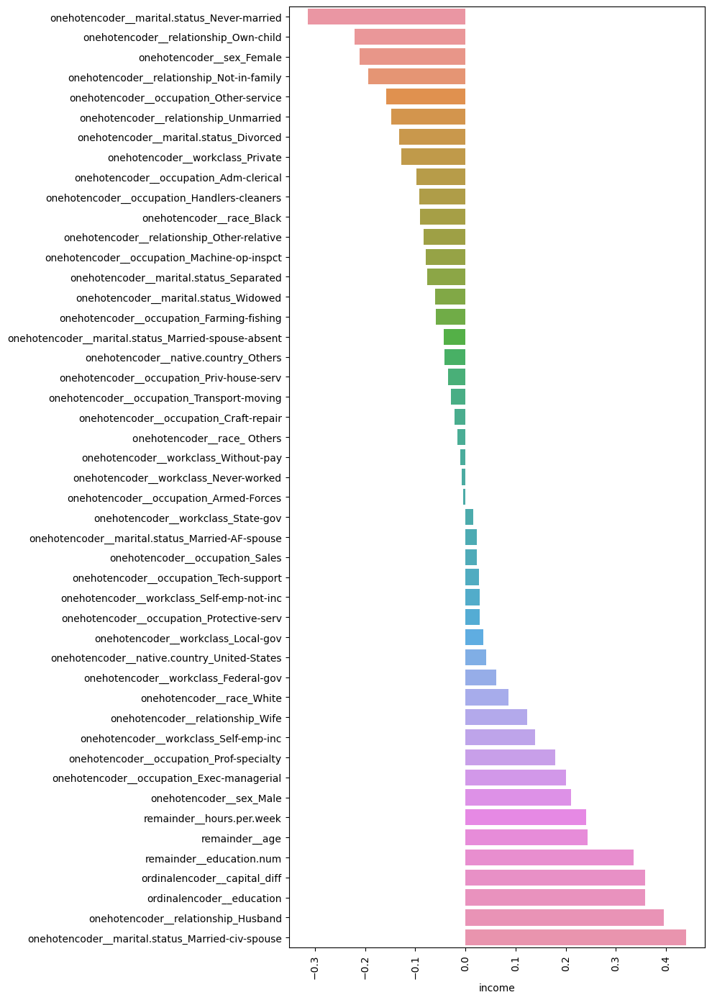

In [96]:
plt.figure(figsize = (10,14))
sns.barplot(y = corr_by_income.index, x = corr_by_income)
plt.xticks(rotation=90)
plt.tight_layout();

# Implement Logistic Regression

In [97]:
operations = [("scaler", StandardScaler()), ("logistic", LogisticRegression())]

log_pipe = Pipeline(steps=operations)

log_pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('logistic', LogisticRegression())])

In [98]:
y_pred = log_pipe.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 1, 0], dtype=int64)

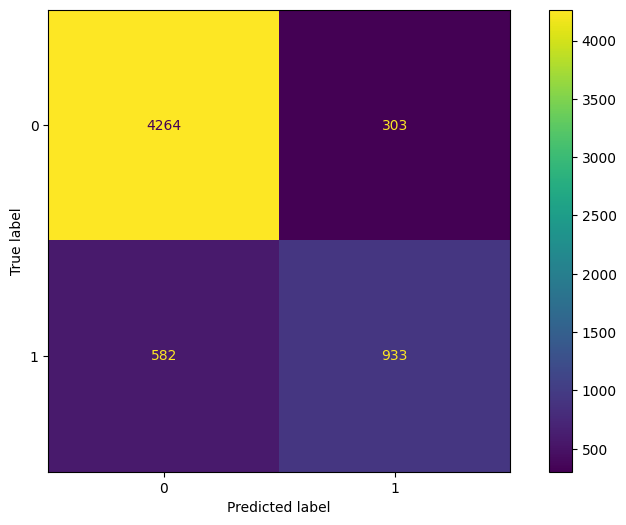

In [99]:
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_estimator(log_pipe, X_test, y_test)

In [100]:
def eval_metric(model, X_train, y_train, X_test, y_test):

    """ to get the metrics for the model """

    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

In [24]:
eval_metric(log_pipe, X_train, y_train, X_test, y_test) 

Test_Set
[[4264  303]
 [ 582  933]]
              precision    recall  f1-score   support

           0       0.88      0.93      0.91      4567
           1       0.75      0.62      0.68      1515

    accuracy                           0.85      6082
   macro avg       0.82      0.77      0.79      6082
weighted avg       0.85      0.85      0.85      6082


Train_Set
[[16962  1304]
 [ 2467  3595]]
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     18266
           1       0.73      0.59      0.66      6062

    accuracy                           0.84     24328
   macro avg       0.80      0.76      0.78     24328
weighted avg       0.84      0.84      0.84     24328



### GridSearchCV

In [102]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

operations = [("scaler", StandardScaler()), ("logistic", LogisticRegression())]

log_pipe = Pipeline(steps=operations)

C = [0.01, 0.1, 1]  # As C increases, regularization decreases
class_weight= ["balanced", None] 
# We can use class_weight= "balanced" to balance classes in unbalanced data sets.
# Using class_weight="balanced" allows the model to correctly classify instances of the underrepresented class.
# we make it more focused, which can often increase the recall of this class.

#To avoid solver-penalty errors
param_grid = [
    {
        "logistic__penalty" : ['l2', 'none'],
        "logistic__C" : C,
        "logistic__class_weight": class_weight,
        "logistic__solver": ['sag', 'lbfgs']
    },
    {
        "logistic__penalty" : ['l1', 'l2'],
        "logistic__C" : C,
        "logistic__class_weight": class_weight,
        "logistic__solver": ['liblinear', 'saga']
    }
]

cv = StratifiedKFold(n_splits = 10) # Can be used on unbalanced data

grid_model = GridSearchCV(estimator=log_pipe,
                          param_grid=param_grid,
                          cv=cv,
                          scoring = "recall",   # By default, the score of class 1 is max. It does. 0 class's max. recall_0 = make_scorer if you want to(recall_score, pos_label =0)
                          n_jobs = -1,
                          return_train_score=True)


#GrdiseachCV also performs Cross Validation to obtain validation and train set scores.
# We specify return_train_score=True. (scoring only returns the metric score we wrote in front of it)

penalty: tells which regularization parameter will be applied in the background. default l2; # l1: Lasso, l2: Ridge

C: severity of regularization, such as alpha in ridge and lasso; As it increases, regularization decreases, the opposite of alpha. For example, if there is overfitting, the C value should be reduced.

balanced: We can use class_weight= "balanced" to balance classes in unbalanced data sets. When the data is balanced, the model tries to increase the recall score of that class by increasing the precision score of the less class.

solver: There is an optimization in the background in our model to minimize the error. Solver also has different algorithms applied during the optimization phase. default: lbfgs

**K-fold cross-validation:**

- This method is a variant of K-Fold cross validation.

- However, whereas regular K-Fold cross validation randomly splits the data into K equally sized subsets, StratifiedKFold splits the data so that each subset contains an almost equal proportion of samples from each class (or target variable) in the original dataset.

- This ensures that the proportion of each class is maintained in the training and test sets, especially in cases where the target variable is unbalanced.

- In summary, StratifiedKFold can be used for data sets with class imbalance.

In [103]:
log_pipe.get_params()

{'memory': None,
 'steps': [('scaler', StandardScaler()), ('logistic', LogisticRegression())],
 'verbose': False,
 'scaler': StandardScaler(),
 'logistic': LogisticRegression(),
 'scaler__copy': True,
 'scaler__with_mean': True,
 'scaler__with_std': True,
 'logistic__C': 1.0,
 'logistic__class_weight': None,
 'logistic__dual': False,
 'logistic__fit_intercept': True,
 'logistic__intercept_scaling': 1,
 'logistic__l1_ratio': None,
 'logistic__max_iter': 100,
 'logistic__multi_class': 'auto',
 'logistic__n_jobs': None,
 'logistic__penalty': 'l2',
 'logistic__random_state': None,
 'logistic__solver': 'lbfgs',
 'logistic__tol': 0.0001,
 'logistic__verbose': 0,
 'logistic__warm_start': False}

In [104]:
grid_model.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('logistic', LogisticRegression())]),
             n_jobs=-1,
             param_grid=[{'logistic__C': [0.01, 0.1, 1],
                          'logistic__class_weight': ['balanced', None],
                          'logistic__penalty': ['l2', 'none'],
                          'logistic__solver': ['sag', 'lbfgs']},
                         {'logistic__C': [0.01, 0.1, 1],
                          'logistic__class_weight': ['balanced', None],
                          'logistic__penalty': ['l1', 'l2'],
                          'logistic__solver': ['liblinear', 'saga']}],
             return_train_score=True, scoring='recall')

In [105]:
grid_model.best_params_

# best_params_ in all hyper_parameter spaces I defined in param_grid
# returns the best hyper_parameter values.

{'logistic__C': 0.01,
 'logistic__class_weight': 'balanced',
 'logistic__penalty': 'l1',
 'logistic__solver': 'liblinear'}

In [106]:
grid_model.best_estimator_

Pipeline(steps=[('scaler', StandardScaler()),
                ('logistic',
                 LogisticRegression(C=0.01, class_weight='balanced',
                                    penalty='l1', solver='liblinear'))])

In [107]:
grid_model.best_score_

0.8482332088233535

In [108]:
grid_model.best_index_

24

In [109]:
pd.DataFrame(grid_model.cv_results_).loc[1, ["mean_test_score", "mean_train_score"]]


# overfitting by pulling "mean_test_score" and "mean_train_score" from the best index of the relevant df and comparing them,
# underfitting evaluation is made.

# Since GridsearchCV also performs cross validation, we do not need to do extra cross validation.

# The scores we get here are the scores of the scoring metric we gave into gridsearchcv.

mean_test_score     0.838501
mean_train_score     0.84138
Name: 1, dtype: object

In [110]:
eval_metric(grid_model, X_train, y_train, X_test, y_test)  

# If we talk about label 0.
# precision 0.94 means 94% of my predictions are accurate.

# recall 0.79 means that I correctly identified 79% of the classes that were actually 0.

# Since f1 score gives the harmonic average of precision and recall scores, it can be used according to your target metric (recall, precision).
# must be interpreted accordingly. Interpreting it alone will cause misinterpretation.

# On an unbalanced dataset, the weighted avg metric provides a fairer performance measurement by taking class distribution into account.
# However, the macro avg metric assumes that each class is equally important, regardless of class distribution
# provides an average.

Test_Set
[[3625  942]
 [ 237 1278]]
              precision    recall  f1-score   support

           0       0.94      0.79      0.86      4567
           1       0.58      0.84      0.68      1515

    accuracy                           0.81      6082
   macro avg       0.76      0.82      0.77      6082
weighted avg       0.85      0.81      0.82      6082


Train_Set
[[14444  3822]
 [  910  5152]]
              precision    recall  f1-score   support

           0       0.94      0.79      0.86     18266
           1       0.57      0.85      0.69      6062

    accuracy                           0.81     24328
   macro avg       0.76      0.82      0.77     24328
weighted avg       0.85      0.81      0.82     24328



1. **Macro Average (Macro Avg):**
     - F1 score (or other metric) is calculated for each class.
     - These values are summed and divided by the number of classes to get the average.
     - Macro average represents situations where all classes are equally important.
     - In unbalanced data sets, the performance of classes with fewer samples is equally taken into account.
     - You can use this metric especially when you want all classes to be evaluated equally.

2. **Weighted Average (Weighted Avg):**
     - F1 score (or other metric) is calculated for each class.
     - These values are weighted by the number of samples in each class and averaged.
     - Weighted average takes into account the importance of classes based on the number of samples.
     - The performance of classes with many examples is evaluated more heavily.



- If you think that the performance of all classes is equally important, you should look at the "Macro Avg" metric.
- However, if you think that some classes have more instances and the performance of these classes is more critical, you should focus on the "Weighted Avg" metric.

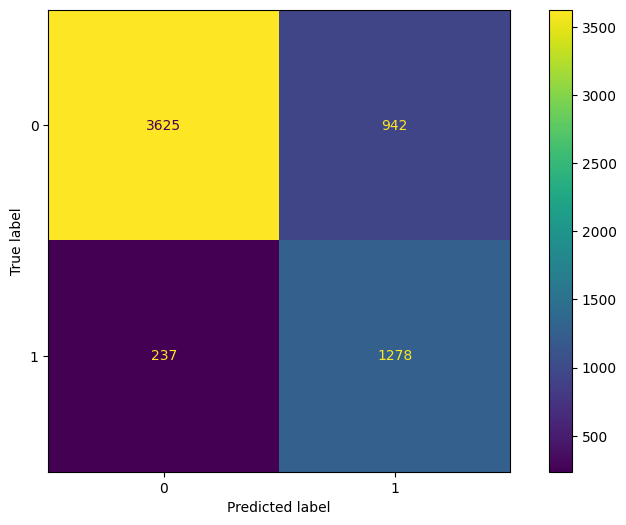

In [112]:
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_estimator(grid_model, X_test, y_test)

**Average Precision** evaluates by combining how well the model predicts positive examples (precision) and also how much of true positive examples it captures (recall).

This metric can be used for a similar purpose to the ROC Curve (Receiver Operating Characteristic Curve) and AUC (Area Under the Curve), but in unbalanced data sets the Precision-Recall Curve and Average Precision can often be more informative.

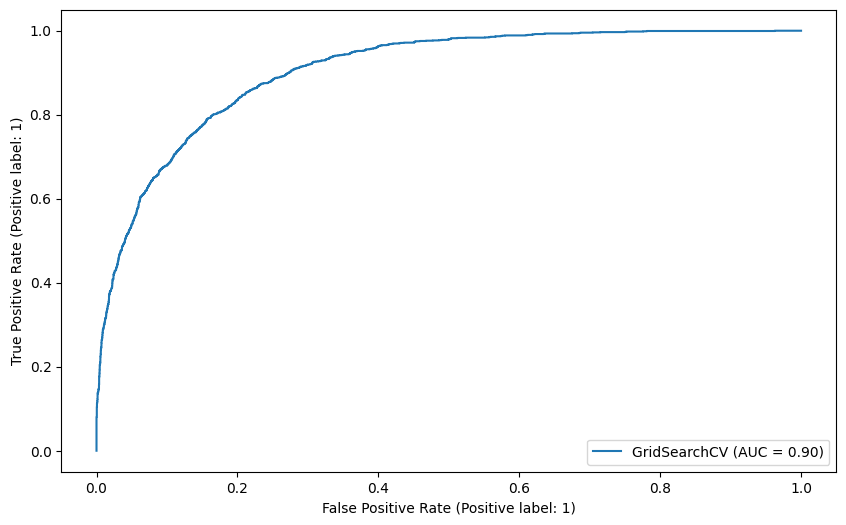

In [113]:
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_estimator(grid_model, X_test, y_test)
 

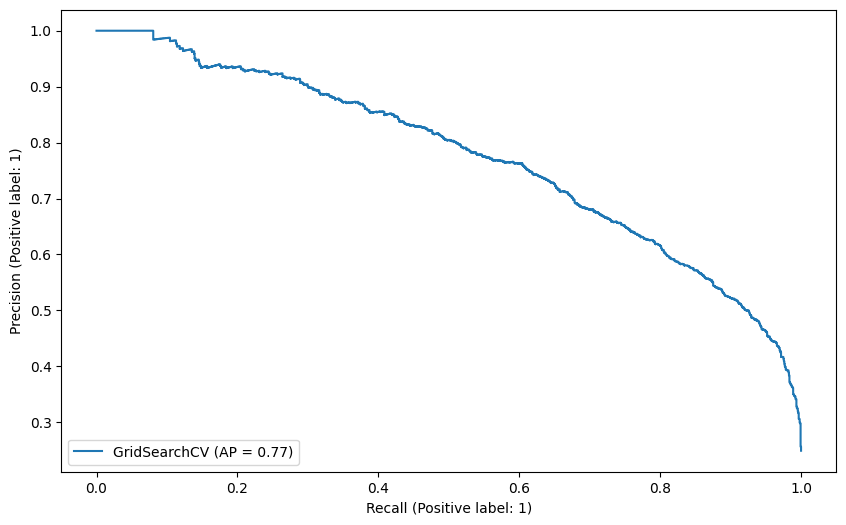

In [114]:
from sklearn.metrics import PrecisionRecallDisplay
PrecisionRecallDisplay.from_estimator(grid_model, X_test, y_test)

# Although both AUC score and Average precision score return close values to each other in balanced data sets
# we use AUC for balanced data sets and average precision scores for unbalanced data sets

# Implement K Nearest Neigbors (KNN)

**Tell me your neighbor and I'll tell you who you are!!**

**Basic principle:** KNN is based on the fact that a data point is similar to its "neighbours". While making a prediction for a data point, the KNN algorithm finds the 'K' data points closest to this data point and makes a prediction based on the features of these neighbors.

**Classification and regression:** KNN can be used in classification and regression problems. For classification, the most common class of the 'K' nearest neighbors becomes the predicted class. For regression, the average of 'K' neighbors becomes the predicted value.

**Distance measurement:** The performance of KNN depends on the selection of neighbors and the metric used to measure the distance between these neighbors. Commonly used distance metrics are Euclidean, Manhattan and Minkowski.

**Selection of K value:** K value is an important parameter that affects the complexity and performance of the model. A small K value may lead to overfitting, while a large K value may cause the model to make a more generalized prediction - underfitting. Determining the best K value is usually found by cross validation.

**Scale:** KNN is sensitive to the scale of features. If there are large scale differences between features, lack of scaling can negatively impact the model's performance. Therefore, it is often recommended to normalize or standardize features before applying KNN.


**Euclidean Distance:** Measures the distance on a straight line between two points. This is the most 'natural' distance we usually think of in a two-dimensional plane. Euclidean distance can also be thought of as the shortest path between two points.

**Manhattan Distance:** Measures the distance between two points by moving horizontally and vertically on a grid.

**Minkowski Distance:** Euclidean and Manhattan distances are actually special cases of the Minkowski distance, which is a general distance measurement.

The **p** value is a parameter: when **p = 2**, the Minkowski distance becomes the Euclidean distance; When **p = 1**, it becomes Manhattan distance.

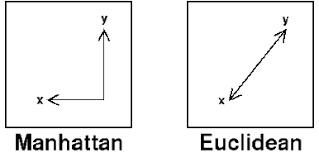

In [115]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier())]

knn_pipe = Pipeline(steps=operations)

knn_pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('knn', KNeighborsClassifier())])

In [116]:
y_pred = knn_pipe.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 1, 0], dtype=int64)

In [117]:
y_pred_proba = knn_pipe.predict_proba(X_test)

In [118]:
pd.DataFrame(y_pred_proba)

# In our model, since weights = uniform and the number of neighbors is 5, 2 of the 5 neighbors around the 1st observation belong to class 1 (0.4).
#3 belongs to class 0 (0.6). For this reason, it will be assigned to class 1 with probability 0.6.

,0,1
0,1.0,0.0
1,0.6,0.4
2,1.0,0.0
3,0.8,0.2
4,1.0,0.0
...,...,...
6077,1.0,0.0
6078,1.0,0.0
6079,1.0,0.0
6080,0.2,0.8


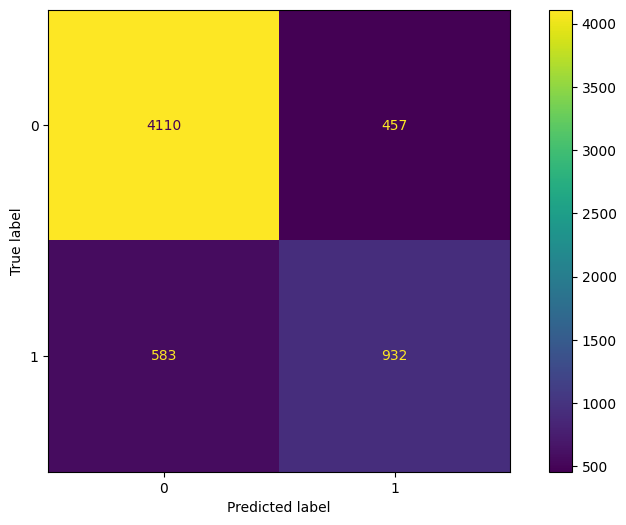

In [119]:
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_estimator(knn_pipe, X_test, y_test)

# plot_confusion_matrix(knn_pipe, X_test, y_test);

In [121]:
eval_metric(knn_pipe, X_train, y_train, X_test, y_test)

Test_Set
[[4110  457]
 [ 583  932]]
              precision    recall  f1-score   support

           0       0.88      0.90      0.89      4567
           1       0.67      0.62      0.64      1515

    accuracy                           0.83      6082
   macro avg       0.77      0.76      0.76      6082
weighted avg       0.82      0.83      0.83      6082


Train_Set
[[17096  1170]
 [ 1819  4243]]
              precision    recall  f1-score   support

           0       0.90      0.94      0.92     18266
           1       0.78      0.70      0.74      6062

    accuracy                           0.88     24328
   macro avg       0.84      0.82      0.83     24328
weighted avg       0.87      0.88      0.87     24328



## Gridsearch Method for Choosing Reasonable K Values

In [124]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier())]
knn_model = Pipeline(steps=operations)

In [125]:
knn_model.get_params()

{'memory': None,
 'steps': [('scaler', StandardScaler()), ('knn', KNeighborsClassifier())],
 'verbose': False,
 'scaler': StandardScaler(),
 'knn': KNeighborsClassifier(),
 'scaler__copy': True,
 'scaler__with_mean': True,
 'scaler__with_std': True,
 'knn__algorithm': 'auto',
 'knn__leaf_size': 30,
 'knn__metric': 'minkowski',
 'knn__metric_params': None,
 'knn__n_jobs': None,
 'knn__n_neighbors': 5,
 'knn__p': 2,
 'knn__weights': 'uniform'}

In [126]:
k_values= range(1,10)

In [127]:
param_grid = {"knn__n_neighbors":k_values, "knn__p": [1,2], "knn__weights": ['uniform', "distance"]}

# Our hyper_parameters that are most important for KNN:
# 1. n_neighbors (in binary models, care should be taken to ensure that it is an odd number to avoid equality between classes.
# For multiclass data, it does not matter whether it is odd or even.)
# 2. weights uniform = gives equal weight, distance = gives weight according to distance, closer to more
# 3. p. p=2 euclidian metric p=1 manhattan metric, p=0 minkowski metric

In [128]:
knn_grid_model = GridSearchCV(knn_model, param_grid, cv=10, scoring = "recall", return_train_score=True, n_jobs=-1)

In [129]:
knn_grid_model.fit(X_train, y_train)


GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('knn', KNeighborsClassifier())]),
             n_jobs=-1,
             param_grid={'knn__n_neighbors': range(1, 10), 'knn__p': [1, 2],
                         'knn__weights': ['uniform', 'distance']},
             return_train_score=True, scoring='recall')

In [130]:
knn_grid_model.best_params_

{'knn__n_neighbors': 5, 'knn__p': 2, 'knn__weights': 'uniform'}

In [131]:
knn_grid_model.best_estimator_

Pipeline(steps=[('scaler', StandardScaler()), ('knn', KNeighborsClassifier())])

In [132]:
knn_grid_model.best_index_

18

In [134]:
pd.DataFrame(knn_grid_model.cv_results_).loc[32, ["mean_test_score", "mean_train_score"]]

mean_test_score      0.59749
mean_train_score    0.655119
Name: 32, dtype: object

In [135]:
knn_grid_model.best_score_

0.611843943867204

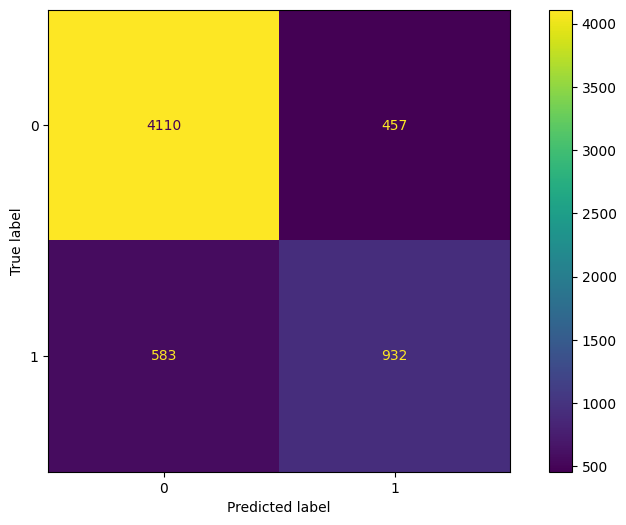

In [136]:
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_estimator(knn_grid_model, X_test, y_test)

# plot_confusion_matrix(knn_grid_model, X_test, y_test)

In [137]:
print('WITH K=9\n')
eval_metric(knn_grid_model, X_train, y_train, X_test, y_test)

WITH K=9

Test_Set
[[4110  457]
 [ 583  932]]
              precision    recall  f1-score   support

           0       0.88      0.90      0.89      4567
           1       0.67      0.62      0.64      1515

    accuracy                           0.83      6082
   macro avg       0.77      0.76      0.76      6082
weighted avg       0.82      0.83      0.83      6082


Train_Set
[[17096  1170]
 [ 1819  4243]]
              precision    recall  f1-score   support

           0       0.90      0.94      0.92     18266
           1       0.78      0.70      0.74      6062

    accuracy                           0.88     24328
   macro avg       0.84      0.82      0.83     24328
weighted avg       0.87      0.88      0.87     24328



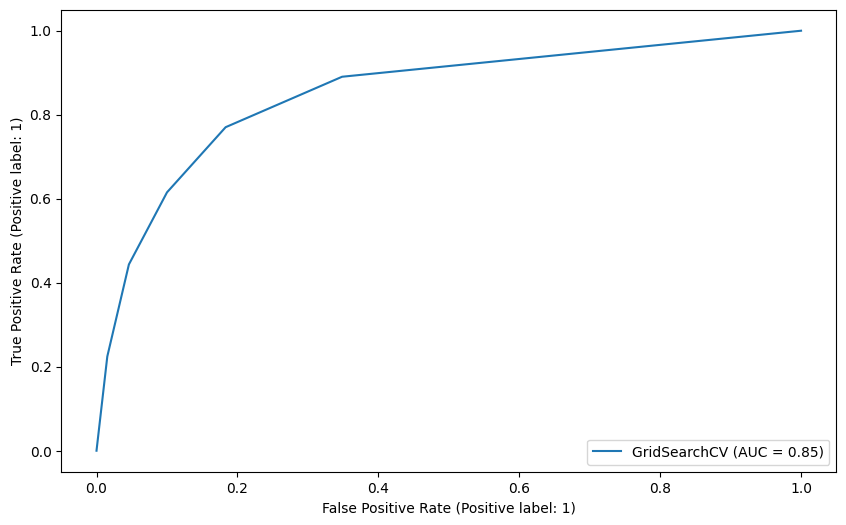

In [138]:
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_estimator(knn_grid_model, X_test, y_test)


In [139]:
y_pred_proba = knn_grid_model.predict_proba(X_test)
roc_auc_score(y_test, y_pred_proba[:,1])

0.8512255736193283

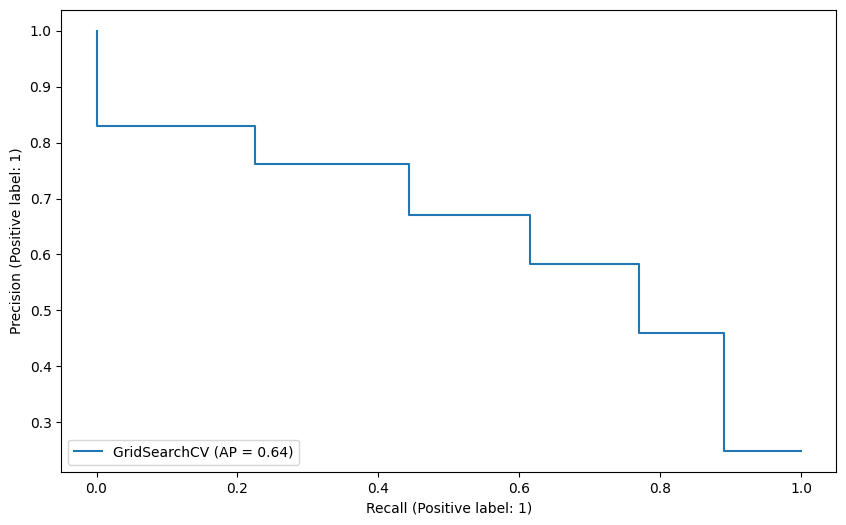

In [140]:
from sklearn.metrics import PrecisionRecallDisplay
PrecisionRecallDisplay.from_estimator(knn_grid_model, X_test, y_test)

# plot_precision_recall_curve(knn_grid_model, X_test, y_test);

# Implement Support Vector Machine

In [141]:
from sklearn.svm import SVC

operations = [("scaler", StandardScaler()), ("svm", SVC())]

svm_pipe = Pipeline(steps=operations)

svm_pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('svm', SVC())])

In [142]:
eval_metric(svm_pipe, X_train, y_train, X_test, y_test)

Test_Set
[[4258  309]
 [ 602  913]]
              precision    recall  f1-score   support

           0       0.88      0.93      0.90      4567
           1       0.75      0.60      0.67      1515

    accuracy                           0.85      6082
   macro avg       0.81      0.77      0.79      6082
weighted avg       0.84      0.85      0.84      6082


Train_Set
[[17164  1102]
 [ 2467  3595]]
              precision    recall  f1-score   support

           0       0.87      0.94      0.91     18266
           1       0.77      0.59      0.67      6062

    accuracy                           0.85     24328
   macro avg       0.82      0.77      0.79     24328
weighted avg       0.85      0.85      0.85     24328



In [143]:
operations = [("scaler", StandardScaler()), ("SVC", SVC())]
svm_pipe = Pipeline(steps=operations)

scores = cross_validate(svm_pipe, X_train, y_train, scoring = ['accuracy', 'precision','recall','f1'], cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_accuracy     0.845569
test_precision    0.745598
test_recall       0.577200
test_f1           0.650517
dtype: float64

## SVC GridsearchCV

C: It is the regularization parameter. The larger this parameter, the lower the classification error, but also the greater the risk of overfitting. Choosing this parameter small may provide better generalization performance.
We were using C to determine hard margin and soft margin. If the model is overfit, C must be reduced.

gamma was the kernel parameter. If the data was nonlinear rather than linear, we added kernel to separate the data, gamma is the kernel parameter.
gamma: Controls the kernel width used in RBF, polynomial and sigmoid kernels.

A low gamma value defines two points being close together and draws a smoother decision boundary.
A high gamma value, on the other hand, only affects very close points to each other and draws a more circular decision boundary.
With gamma='scale', the data is scaled so that each feature has the same weight for gamma, even if they are at a different scale

If the model is overfit, we need to reduce the gamma value, if the model is underfit, we need to increase the gamma value.

kernel: Determines the kernel function used to transform data into higher dimensional spaces. Kernels such as linear, polynomial, RBF (Gaussian) and sigmoid can be used.

degree: It is the degree parameter for the polynomial kernel. Its default value is 3.

In [144]:
svm_pipe.get_params() ## The answer to how to put money into the grid

{'memory': None,
 'steps': [('scaler', StandardScaler()), ('SVC', SVC())],
 'verbose': False,
 'scaler': StandardScaler(),
 'SVC': SVC(),
 'scaler__copy': True,
 'scaler__with_mean': True,
 'scaler__with_std': True,
 'SVC__C': 1.0,
 'SVC__break_ties': False,
 'SVC__cache_size': 200,
 'SVC__class_weight': None,
 'SVC__coef0': 0.0,
 'SVC__decision_function_shape': 'ovr',
 'SVC__degree': 3,
 'SVC__gamma': 'scale',
 'SVC__kernel': 'rbf',
 'SVC__max_iter': -1,
 'SVC__probability': False,
 'SVC__random_state': None,
 'SVC__shrinking': True,
 'SVC__tol': 0.001,
 'SVC__verbose': False}

In [145]:
param_grid = {"SVC__C":[0.01, 1],
             "SVC__gamma":[0.1, 0.3, 0.5],
             "SVC__kernel":["rbf", "linear"]}

In [146]:
operations = [("scaler", StandardScaler()), ("SVC", SVC(class_weight="balanced"))]
pipe_model = Pipeline(steps=operations)

svm_model_grid = GridSearchCV(pipe_model, param_grid, scoring='recall_macro', cv=5)

The **class_weight="balanced"** setting assigns weights to classes in inverse proportion to their class frequencies. This ensures that the less represented class (minority class) is given more importance during model training, thus helping the model to recognize this class better

In [147]:
svm_model_grid.get_params

<bound method BaseEstimator.get_params of GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('SVC', SVC(class_weight='balanced'))]),
             param_grid={'SVC__C': [0.01, 1], 'SVC__gamma': [0.1, 0.3, 0.5],
                         'SVC__kernel': ['rbf', 'linear']},
             scoring='recall_macro')>

In [148]:
svm_model_grid.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('SVC', SVC(class_weight='balanced'))]),
             param_grid={'SVC__C': [0.01, 1], 'SVC__gamma': [0.1, 0.3, 0.5],
                         'SVC__kernel': ['rbf', 'linear']},
             scoring='recall_macro')

In [149]:
svm_model_grid.best_score_

0.7976704962563932

In [150]:
svm_model_grid.best_params_

{'SVC__C': 1, 'SVC__gamma': 0.1, 'SVC__kernel': 'rbf'}

In [151]:
svm_model_grid.best_index_

6

In [152]:
eval_metric(svm_model_grid, X_train, y_train, X_test, y_test)

Test_Set
[[3655  912]
 [ 290 1225]]
              precision    recall  f1-score   support

           0       0.93      0.80      0.86      4567
           1       0.57      0.81      0.67      1515

    accuracy                           0.80      6082
   macro avg       0.75      0.80      0.76      6082
weighted avg       0.84      0.80      0.81      6082


Train_Set
[[14898  3368]
 [  593  5469]]
              precision    recall  f1-score   support

           0       0.96      0.82      0.88     18266
           1       0.62      0.90      0.73      6062

    accuracy                           0.84     24328
   macro avg       0.79      0.86      0.81     24328
weighted avg       0.88      0.84      0.85     24328



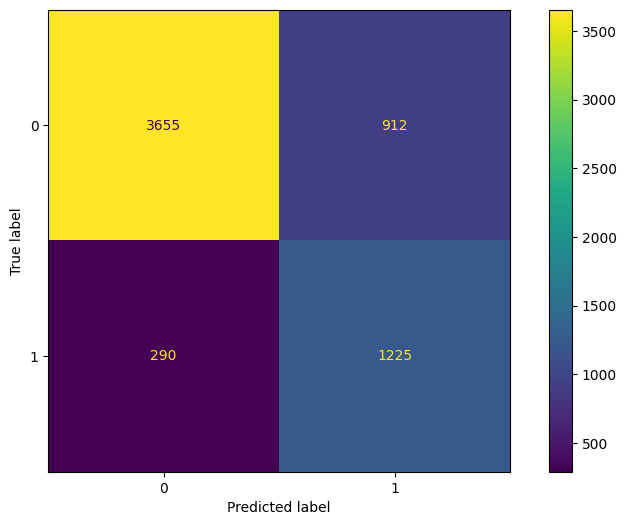

In [153]:
ConfusionMatrixDisplay.from_estimator(svm_model_grid, X_test, y_test)


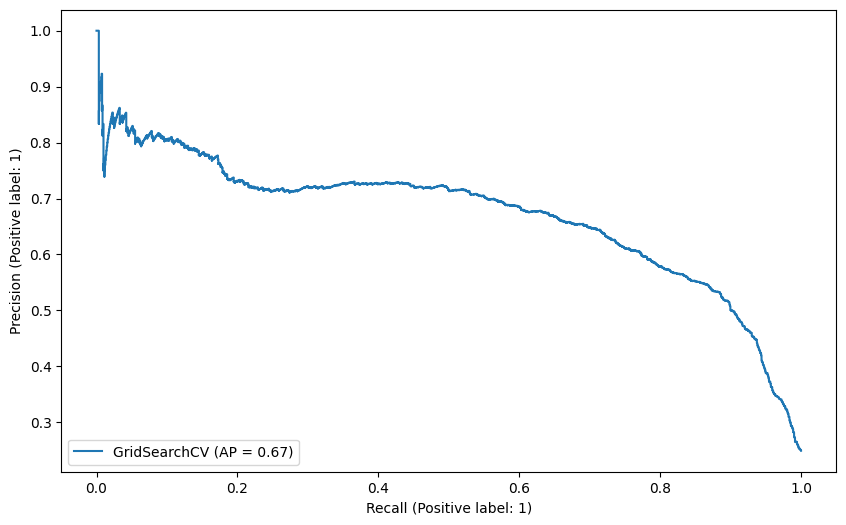

In [154]:
from sklearn.metrics import PrecisionRecallDisplay
PrecisionRecallDisplay.from_estimator(svm_model_grid, X_test, y_test)

# from sklearn.metrics import plot_precision_recall_curve

# plot_precision_recall_curve(svm_model_grid, X_test, y_test);

# Although both AUC score and Average precision score return close values to each other in balanced data sets
# we should use AUC for balanced data sets and average precision scores for unbalanced data sets

# Conclusion

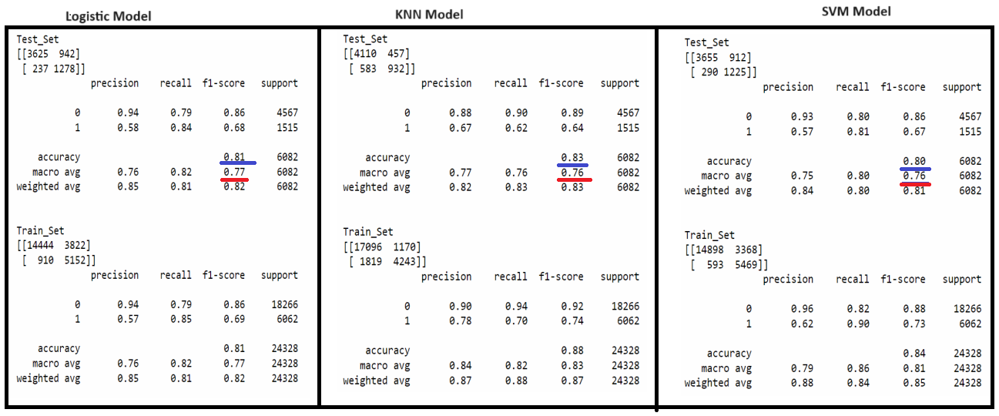

"Model selection typically depends on the dataset, the problem at hand, and what's considered important. When dealing with imbalanced data, accuracy alone may not be sufficient to evaluate a model's performance.

In such cases, metrics like precision, recall, and F1-score often take precedence. F1-score represents the harmonic mean of precision and recall, providing a more robust performance measure for unbalanced datasets.

In unbalanced datasets, focusing on the macro average score becomes more crucial. The macro average score in the logistic model is 0.77, while in the others, it's 0.76. Hence, opting for the logistic model would be more suitable.

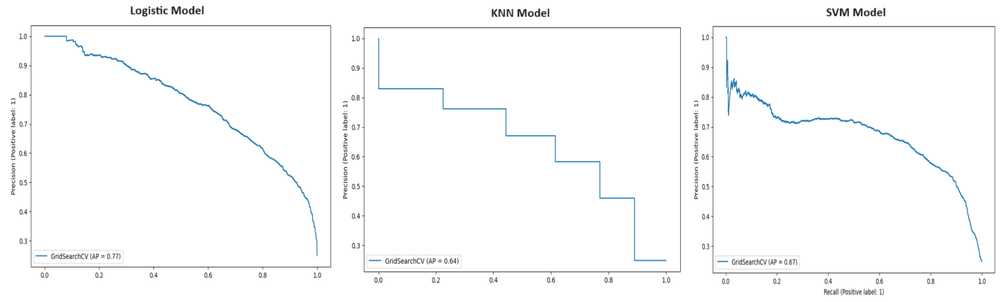

Given the imbalanced nature of the data, utilizing the Average Precision (AP) scores would be more appropriate. According to the AP scores, Logistic Regression yields 0.77, KNN results in 0.64, and SVM yields 0.67. As the highest score is achieved with Logistic Regression, it appears more suitable to opt for the logistic model.

 <p style="background-color:green;font-family:newtimeroman;font-size:100%;color:white;text-align:center;border-radius:20px 20px;"><b>You're welcome! Hope it proves helpful.</b></p>

**İlhami Mutlu** [LinkedIn](https://www.linkedin.com/in/ilhami-mutlu-653b02242/) |